# Car accident severity
#### Djibril ISSOUFOU MAMAN
#### September 23, 2020

### Problematic

Using the data one could predict the likelihood of an accident occurring or even the potential severity of the accident. This will allow users to be notified in time to take the necessary measures.


In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv("https://s3.us.cloud-object-storage.appdomain.cloud/cf-courses-data/CognitiveClass/DP0701EN/version-2/Data-Collisions.csv")
df.head()

C:\Users\Djibril\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [3]:
df.describe(include='all')

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
count,194673.000000,189339.000000,189339.000000,194673.000000,194673.000000,194673.000000,194673,194673,192747,65070.000000,...,189661,189503,4667,1.149360e+05,9333,194655,189769,194673.000000,1.946730e+05,194673
unique,NaN,NaN,NaN,NaN,NaN,NaN,194670,2,3,NaN,...,9,9,1,NaN,1,115,62,NaN,NaN,2
top,NaN,NaN,NaN,NaN,NaN,NaN,1780512,Matched,Block,NaN,...,Dry,Daylight,Y,NaN,Y,32,One parked--one moving,NaN,NaN,N
freq,NaN,NaN,NaN,NaN,NaN,NaN,2,189786,126926,NaN,...,124510,116137,4667,NaN,9333,27612,44421,NaN,NaN,187457
mean,1.298901,-122.330518,47.619543,108479.364930,141091.456350,141298.811381,NaN,NaN,NaN,37558.450576,...,NaN,NaN,NaN,7.972521e+06,NaN,NaN,NaN,269.401114,9.782452e+03,NaN
std,0.457778,0.029976,0.056157,62649.722558,86634.402737,86986.542110,NaN,NaN,NaN,51745.990273,...,NaN,NaN,NaN,2.553533e+06,NaN,NaN,NaN,3315.776055,7.226926e+04,NaN
min,1.000000,-122.419091,47.495573,1.000000,1001.000000,1001.000000,NaN,NaN,NaN,23807.000000,...,NaN,NaN,NaN,1.007024e+06,NaN,NaN,NaN,0.000000,0.000000e+00,NaN
25%,1.000000,-122.348673,47.575956,54267.000000,70383.000000,70383.000000,NaN,NaN,NaN,28667.000000,...,NaN,NaN,NaN,6.040015e+06,NaN,NaN,NaN,0.000000,0.000000e+00,NaN
50%,1.000000,-122.330224,47.615369,106912.000000,123363.000000,123363.000000,NaN,NaN,NaN,29973.000000,...,NaN,NaN,NaN,8.023022e+06,NaN,NaN,NaN,0.000000,0.000000e+00,NaN
75%,2.000000,-122.311937,47.663664,162272.000000,203319.000000,203459.000000,NaN,NaN,NaN,33973.000000,...,NaN,NaN,NaN,1.015501e+07,NaN,NaN,NaN,0.000000,0.000000e+00,NaN


In [4]:
print(df.dtypes)

SEVERITYCODE        int64
X                 float64
Y                 float64
OBJECTID            int64
INCKEY              int64
COLDETKEY           int64
REPORTNO           object
STATUS             object
ADDRTYPE           object
INTKEY            float64
LOCATION           object
EXCEPTRSNCODE      object
EXCEPTRSNDESC      object
SEVERITYCODE.1      int64
SEVERITYDESC       object
COLLISIONTYPE      object
PERSONCOUNT         int64
PEDCOUNT            int64
PEDCYLCOUNT         int64
VEHCOUNT            int64
INCDATE            object
INCDTTM            object
JUNCTIONTYPE       object
SDOT_COLCODE        int64
SDOT_COLDESC       object
INATTENTIONIND     object
UNDERINFL          object
WEATHER            object
ROADCOND           object
LIGHTCOND          object
PEDROWNOTGRNT      object
SDOTCOLNUM        float64
SPEEDING           object
ST_COLCODE         object
ST_COLDESC         object
SEGLANEKEY          int64
CROSSWALKKEY        int64
HITPARKEDCAR       object
dtype: objec

## Data Analysis

In [5]:
df.drop(['OBJECTID','SEVERITYDESC', 'INCKEY','COLDETKEY','REPORTNO','STATUS','INTKEY','LOCATION','EXCEPTRSNCODE','PEDCOUNT','PEDCYLCOUNT','EXCEPTRSNDESC','SEVERITYCODE.1','INCDTTM','SDOT_COLCODE','SDOT_COLDESC','SDOTCOLNUM','ST_COLCODE','ST_COLDESC','SEGLANEKEY','CROSSWALKKEY', 'PEDROWNOTGRNT'],axis=1, inplace=True)
df.columns

Index(['SEVERITYCODE', 'X', 'Y', 'ADDRTYPE', 'COLLISIONTYPE', 'PERSONCOUNT',
       'VEHCOUNT', 'INCDATE', 'JUNCTIONTYPE', 'INATTENTIONIND', 'UNDERINFL',
       'WEATHER', 'ROADCOND', 'LIGHTCOND', 'PEDROWNOTGRNT', 'SPEEDING',
       'HITPARKEDCAR'],
      dtype='object')

In [6]:
null_values = df.isnull()

### Dealing with Other Missing Values

In [9]:
count = df[['ADDRTYPE', 'COLLISIONTYPE', 'JUNCTIONTYPE', 'INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'SPEEDING',]]
count

,ADDRTYPE,COLLISIONTYPE,JUNCTIONTYPE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING
0,Intersection,Angles,At Intersection (intersection related),NaN,N,Overcast,Wet,Daylight,NaN
1,Block,Sideswipe,Mid-Block (not related to intersection),NaN,0,Raining,Wet,Dark - Street Lights On,NaN
2,Block,Parked Car,Mid-Block (not related to intersection),NaN,0,Overcast,Dry,Daylight,NaN
3,Block,Other,Mid-Block (not related to intersection),NaN,N,Clear,Dry,Daylight,NaN
4,Intersection,Angles,At Intersection (intersection related),NaN,0,Raining,Wet,Daylight,NaN
...,...,...,...,...,...,...,...,...,...
194668,Block,Head On,Mid-Block (not related to intersection),NaN,N,Clear,Dry,Daylight,NaN
194669,Block,Rear Ended,Mid-Block (not related to intersection),Y,N,Raining,Wet,Daylight,NaN
194670,Intersection,Left Turn,At Intersection (intersection related),NaN,N,Clear,Dry,Daylight,NaN
194671,Intersection,Cycles,At Intersection (intersection related),NaN,N,Clear,Dry,Dusk,NaN


In [10]:
freq = df['ADDRTYPE'].value_counts().idxmax()
df['ADDRTYPE'].replace(np.nan, freq, inplace=True)

In [11]:
freq = df['WEATHER'].value_counts().idxmax()
df['WEATHER'].replace(np.nan, freq, inplace=True)

In [12]:
df['INATTENTIONIND'].replace(np.nan, "N", inplace=True)

In [13]:
freqmax = df['LIGHTCOND'].value_counts().idxmax()
df['LIGHTCOND'].replace(np.nan, freqmax, inplace=True)

In [14]:
df['JUNCTIONTYPE'].replace(np.nan, "Unknown", inplace=True)

In [15]:
df['COLLISIONTYPE'].replace(np.nan, "Other", inplace=True)

In [16]:
freq = df['ROADCOND'].value_counts().idxmax()
df['ROADCOND'].replace(np.nan, freq, inplace=True)

In [17]:
df['SPEEDING'].replace(np.nan, "N", inplace=True)

In [18]:
df.drop(df[df['WEATHER'] == 'Unknown'].index, inplace = True)

In [19]:
df['LIGHTCOND'].replace('Dark - No Street Lights', 'Dark - Street Lights Off', inplace=True)
df['LIGHTCOND'].replace('Dark - Unknown Lighting', 'Dark', inplace=True)

In [20]:
df.drop(df[df['ROADCOND'] == 'Unknown'].index, inplace = True)

In [21]:
df.drop(df[df['JUNCTIONTYPE'] == 'Unknown'].index, inplace = True)

In [22]:
df['UNDERINFL'].replace('0', 'N', inplace=True)
df['UNDERINFL'].replace('1', 'Y', inplace=True)

In [31]:
df.drop(df[df['LIGHTCOND'] == 'Unknown'].index, inplace = True)

In [42]:
# df["SPEEDING"].replace(np.nan, 0, inplace=True)
df['SPEEDING'].replace('N', 0, inplace=True)
df['SPEEDING'].replace('Y', 1, inplace=True)
df['UNDERINFL'].replace('N', 0, inplace=True)
df['UNDERINFL'].replace('Y', 1, inplace=True)
# df["UNDERINFL"].replace(np.nan, 0, inplace=True)
df['INATTENTIONIND'].replace('N', 0, inplace=True)
df['INATTENTIONIND'].replace('Y', 1, inplace=True)
# df["INATTENTIONIND"].replace(np.nan, 0, inplace=True)
df['HITPARKEDCAR'].replace('N', 0, inplace=True)
df['HITPARKEDCAR'].replace('Y', 1, inplace=True)
# df["HITPARKEDCAR"].replace(np.nan, 0, inplace=True)

In [25]:
df.head()

,SEVERITYCODE,X,Y,ADDRTYPE,COLLISIONTYPE,PERSONCOUNT,VEHCOUNT,INCDATE,JUNCTIONTYPE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING,HITPARKEDCAR
0,2,-122.323148,47.703140,Intersection,Angles,2,2,2013/03/27 00:00:00+00,At Intersection (intersection related),0,0,Overcast,Wet,Daylight,0,0
1,1,-122.347294,47.647172,Block,Sideswipe,2,2,2006/12/20 00:00:00+00,Mid-Block (not related to intersection),0,0,Raining,Wet,Dark - Street Lights On,0,0
2,1,-122.334540,47.607871,Block,Parked Car,4,3,2004/11/18 00:00:00+00,Mid-Block (not related to intersection),0,0,Overcast,Dry,Daylight,0,0
3,1,-122.334803,47.604803,Block,Other,3,3,2013/03/29 00:00:00+00,Mid-Block (not related to intersection),0,0,Clear,Dry,Daylight,0,0
4,2,-122.306426,47.545739,Intersection,Angles,2,2,2004/01/28 00:00:00+00,At Intersection (intersection related),0,0,Raining,Wet,Daylight,0,0


In [40]:
# df[["INATTENTIONIND", "UNDERINFL", "SPEEDING", "HITPARKEDCAR"]] = df[["INATTENTIONIND", "UNDERINFL", "SPEEDING", "HITPARKEDCAR"]].astype("int")
df.dtypes

SEVERITYCODE        int64
X                 float64
Y                 float64
ADDRTYPE           object
COLLISIONTYPE      object
PERSONCOUNT         int64
VEHCOUNT            int64
INCDATE            object
JUNCTIONTYPE       object
INATTENTIONIND      int32
UNDERINFL           int32
WEATHER            object
ROADCOND           object
LIGHTCOND          object
SPEEDING            int32
HITPARKEDCAR        int32
dtype: object

In [29]:
df_nombre = df.loc[:]
df_nombre['WEATHER'].replace(to_replace=['Overcast','Raining','Clear','Snowing','Other','Fog/Smog/Smoke', 'Sleet/Hail/Freezing Rain','Blowing Sand/Dirt', 'Severe Crosswind','Partly Cloudy'], value=[1,2,3,4,5,6,7,8,9,10],inplace=True)

df_nombre['ROADCOND'].replace(to_replace=['Dry', 'Sand/Mud/Dirt', 'Wet','Standing Water', 'Oil', 'Snow/Slush', 'Ice', 'Other'], value=[1,2,3,4,5,6,7,8],inplace=True)

df_nombre['LIGHTCOND'].replace(to_replace=['Dawn', 'Daylight', 'Dusk', 'Dark - Street Lights On', 'Dark - Street Lights Off', 'Dark', 'Other'], value=[1,2,3,4,5,6,7],inplace=True)

df_nombre['ADDRTYPE'].replace(to_replace=['Block', 'Intersection', 'Alley'], value=[1,2,3],inplace=True)

df_nombre['COLLISIONTYPE'].replace(to_replace=['Angles', 'Parked Car', 'Rear Ended', 'Other', 'Sideswipe', 'Left Turn', 'Pedestrian', 'Cycles', 'Right Turn', 'Head On'], value=[1,2,3,4,5,6,7,8,9,10],inplace=True)

df_nombre['JUNCTIONTYPE'].replace(to_replace=['Mid-Block (not related to intersection)', 'At Intersection (intersection related)', 'Mid-Block (but intersection related)', 'Driveway Junction', 'At Intersection (but not related to intersection)', 'Ramp Junction'], value=[1,2,3,4,5,6],inplace=True)    
 
df_nombre.drop(['INCDATE'], axis=1, inplace=True)

df_nombre.drop(['X'], axis=1, inplace=True)
df_nombre.drop(['Y'], axis=1, inplace=True)

### The Correlations

In [18]:
df.corr()

,SEVERITYCODE,X,Y,PERSONCOUNT,VEHCOUNT,INATTENTIONIND,UNDERINFL,SPEEDING,HITPARKEDCAR
SEVERITYCODE,1.000000,0.006720,0.025757,0.114616,-0.047699,0.030811,0.032387,0.027587,-0.085961
X,0.006720,1.000000,-0.158634,0.012129,-0.011347,-0.019602,-0.034248,-0.009981,-0.016878
Y,0.025757,-0.158634,1.000000,-0.011570,0.015553,0.012258,-0.004681,-0.024796,-0.016777
PERSONCOUNT,0.114616,0.012129,-0.011570,1.000000,0.383231,0.069815,0.015799,-0.009934,-0.041096
VEHCOUNT,-0.047699,-0.011347,0.015553,0.383231,1.000000,0.081871,0.009675,-0.023665,0.047573
INATTENTIONIND,0.030811,-0.019602,0.012258,0.069815,0.081871,1.000000,-0.033350,-0.056597,0.017722
UNDERINFL,0.032387,-0.034248,-0.004681,0.015799,0.009675,-0.033350,1.000000,0.089300,0.025327
SPEEDING,0.027587,-0.009981,-0.024796,-0.009934,-0.023665,-0.056597,0.089300,1.000000,-0.021687
HITPARKEDCAR,-0.085961,-0.016878,-0.016777,-0.041096,0.047573,0.017722,0.025327,-0.021687,1.000000


In [19]:
df_nombre.corr()

,SEVERITYCODE,ADDRTYPE,COLLISIONTYPE,PERSONCOUNT,VEHCOUNT,JUNCTIONTYPE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING,HITPARKEDCAR
SEVERITYCODE,1.000000,0.168967,0.153360,0.114616,-0.047699,0.082422,0.030811,0.032387,-0.005868,-0.001235,-0.029804,0.027587,-0.085961
ADDRTYPE,0.168967,1.000000,0.025514,0.047121,-0.072367,0.209585,-0.096458,-0.055898,-0.012489,-0.003310,-0.032144,-0.071925,-0.116806
COLLISIONTYPE,0.153360,0.025514,1.000000,-0.045447,-0.296308,0.026931,-0.017740,-0.006697,0.003326,-0.004160,-0.017913,0.006763,-0.099756
PERSONCOUNT,0.114616,0.047121,-0.045447,1.000000,0.383231,0.049028,0.069815,0.015799,-0.009141,-0.002322,0.000944,-0.009934,-0.041096
VEHCOUNT,-0.047699,-0.072367,-0.296308,0.383231,1.000000,0.001458,0.081871,0.009675,-0.041934,0.023816,0.018826,-0.023665,0.047573
JUNCTIONTYPE,0.082422,0.209585,0.026931,0.049028,0.001458,1.000000,0.001482,-0.044127,-0.018454,-0.004633,-0.059012,-0.028210,-0.107552
INATTENTIONIND,0.030811,-0.096458,-0.017740,0.069815,0.081871,0.001482,1.000000,-0.033350,0.003899,-0.033590,-0.054505,-0.056597,0.017722
UNDERINFL,0.032387,-0.055898,-0.006697,0.015799,0.009675,-0.044127,-0.033350,1.000000,-0.001494,0.007717,0.233664,0.089300,0.025327
WEATHER,-0.005868,-0.012489,0.003326,-0.009141,-0.041934,-0.018454,0.003899,-0.001494,1.000000,-0.366802,-0.066361,-0.049324,0.023451
ROADCOND,-0.001235,-0.003310,-0.004160,-0.002322,0.023816,-0.004633,-0.033590,0.007717,-0.366802,1.000000,0.159868,0.160306,-0.017075


### Multiple Linear Regression

In [43]:
import sklearn

In [20]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()


Z = dfnumbers[['ADDRTYPE','COLLISIONTYPE','PERSONCOUNT','VEHCOUNT','JUNCTIONTYPE','INATTENTIONIND','UNDERINFL','SPEEDING','HITPARKEDCAR','WEATHER','ROADCOND','LIGHTCOND',]]

Z.head()


,ADDRTYPE,COLLISIONTYPE,PERSONCOUNT,VEHCOUNT,JUNCTIONTYPE,INATTENTIONIND,UNDERINFL,SPEEDING,HITPARKEDCAR,WEATHER,ROADCOND,LIGHTCOND
0,2,1,2,2,2,0,0,0,0,1,3,2
1,1,5,2,2,1,0,0,0,0,2,3,4
2,1,2,4,3,1,0,0,0,0,1,1,2
3,1,4,3,3,1,0,0,0,0,3,1,2
4,2,1,2,2,2,0,0,0,0,2,3,2


In [21]:
lr.fit(Z,dfnumbers['SEVERITYCODE'])

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [22]:
lr.coef_

array([ 0.14780618,  0.0304175 ,  0.04124933, -0.03162561,  0.01859242,
        0.05800586,  0.10232676,  0.08192984, -0.12408279, -0.00236836,
       -0.00047904, -0.01500465])

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 

/opt/conda/envs/Python36/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


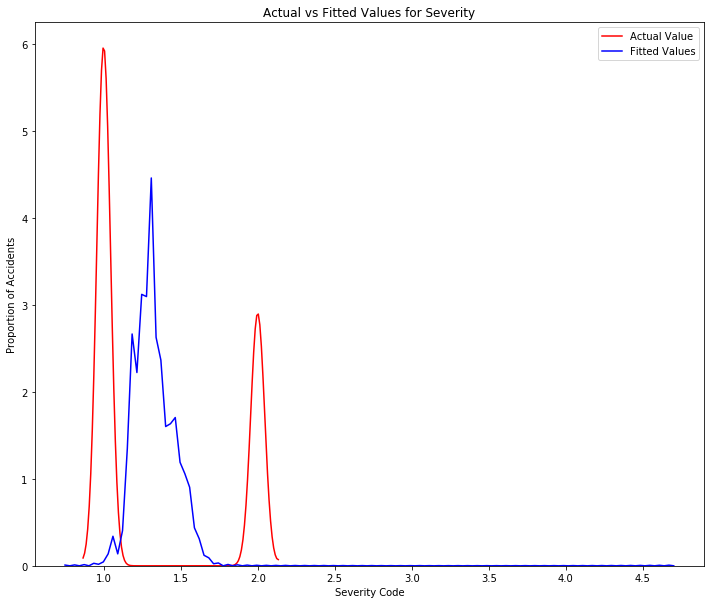

In [23]:
Y_hat = lr.predict(Z) 

plt.figure(figsize=(12,10))
ax1 = sns.distplot(dfnumbers['SEVERITYCODE'], hist=False, color="r", label="Actual Value")
sns.distplot(Y_hat, hist=False, color="b", label="Fitted Values" , ax=ax1)
plt.title('Actual vs Fitted Values for Severity')
plt.xlabel('Severity Code')
plt.ylabel('Proportion of Accidents')

plt.show()
plt.close()

In [24]:
lr.score(Z,dfnumbers['SEVERITYCODE'])

0.07480986541670931

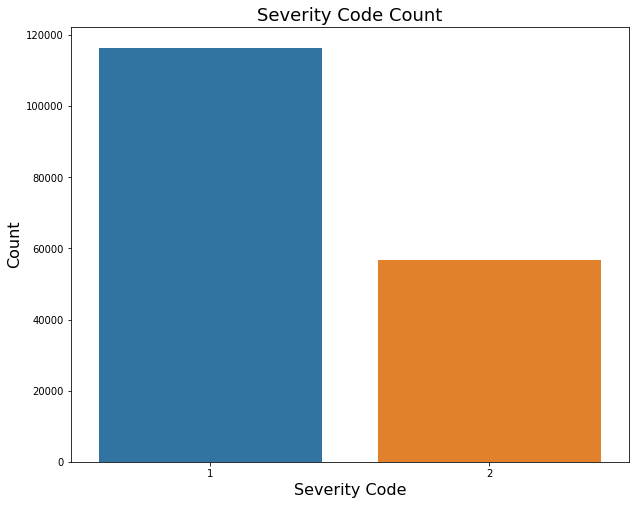

In [25]:
plt.figure(figsize=(10,8))
sns.countplot(x ='SEVERITYCODE', data = df) 
plt.title('Severity Code Count', fontsize=18)
plt.xlabel('Severity Code', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.show()

## Balancing the Data

In [ ]:
!conda install -c glemaitre imbalanced-learn

### Oversampling using SMOTE

In [ ]:
import imblearn

In [27]:
from imblearn.over_sampling import SMOTE

seed = 100
k = 2
X = dfnumbers.loc[:, dfnumbers.columns != 'SEVERITYCODE']
y = dfnumbers['SEVERITYCODE']
sm = SMOTE(k_neighbors=k, random_state=seed)
X_res, y_res = sm.fit_sample(X, y)
dfoversampled = pd.concat([pd.DataFrame(X_res), pd.DataFrame(y_res)], axis=1)
dfoversampled.head()

,0,1,2,3,4,5,6,7,8,9,10,11,0
0,2.0,1.0,2.0,2.0,2.0,0.0,0.0,1.0,3.0,2.0,0.0,0.0,2
1,1.0,5.0,2.0,2.0,1.0,0.0,0.0,2.0,3.0,4.0,0.0,0.0,1
2,1.0,2.0,4.0,3.0,1.0,0.0,0.0,1.0,1.0,2.0,0.0,0.0,1
3,1.0,4.0,3.0,3.0,1.0,0.0,0.0,3.0,1.0,2.0,0.0,0.0,1
4,2.0,1.0,2.0,2.0,2.0,0.0,0.0,2.0,3.0,2.0,0.0,0.0,2


In [28]:
dfoversampled.columns = ['ADDRTYPE', 'COLLISIONTYPE', 'PERSONCOUNT', 'VEHCOUNT', 'JUNCTIONTYPE', 'INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'SPEEDING', 'HITPARKEDCAR','SEVERITYCODE']


In [29]:
dfoversampled.dtypes

ADDRTYPE          float64
COLLISIONTYPE     float64
PERSONCOUNT       float64
VEHCOUNT          float64
JUNCTIONTYPE      float64
INATTENTIONIND    float64
UNDERINFL         float64
WEATHER           float64
ROADCOND          float64
LIGHTCOND         float64
SPEEDING          float64
HITPARKEDCAR      float64
SEVERITYCODE        int64
dtype: object

In [30]:
dfoversampled.shape

(232916, 13)

In [31]:
dfoversampled['SEVERITYCODE'].value_counts()

2    116458
1    116458
Name: SEVERITYCODE, dtype: int64

#### Checking Correlation and Linear Regression with Oversampled data

In [32]:
dfoversampled.corr()

,ADDRTYPE,COLLISIONTYPE,PERSONCOUNT,VEHCOUNT,JUNCTIONTYPE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING,HITPARKEDCAR,SEVERITYCODE
ADDRTYPE,1.000000,0.026706,0.033969,-0.090096,0.196637,-0.110439,-0.061555,-0.010905,-0.004126,-0.027120,-0.082867,-0.112319,0.177755
COLLISIONTYPE,0.026706,1.000000,-0.071165,-0.343268,0.017042,-0.020081,-0.006113,0.004223,-0.006088,-0.009667,-0.002819,-0.092788,0.157219
PERSONCOUNT,0.033969,-0.071165,1.000000,0.401198,0.042712,0.068579,0.012778,-0.009198,-0.003962,0.003925,-0.009953,-0.038478,0.118643
VEHCOUNT,-0.090096,-0.343268,0.401198,1.000000,-0.001574,0.084860,0.008639,-0.037902,0.022233,0.009187,-0.012194,0.048207,-0.051236
JUNCTIONTYPE,0.196637,0.017042,0.042712,-0.001574,1.000000,-0.000824,-0.050350,-0.016163,-0.003754,-0.055230,-0.038115,-0.103357,0.088518
INATTENTIONIND,-0.110439,-0.020081,0.068579,0.084860,-0.000824,1.000000,-0.040301,0.008474,-0.037803,-0.054855,-0.061046,0.013958,0.030270
UNDERINFL,-0.061555,-0.006113,0.012778,0.008639,-0.050350,-0.040301,1.000000,0.000646,0.003836,0.242356,0.093138,0.025869,0.029171
WEATHER,-0.010905,0.004223,-0.009198,-0.037902,-0.016163,0.008474,0.000646,1.000000,-0.380332,-0.069399,-0.044960,0.021057,-0.007407
ROADCOND,-0.004126,-0.006088,-0.003962,0.022233,-0.003754,-0.037803,0.003836,-0.380332,1.000000,0.163155,0.153407,-0.015889,-0.001979
LIGHTCOND,-0.027120,-0.009667,0.003925,0.009187,-0.055230,-0.054855,0.242356,-0.069399,0.163155,1.000000,0.088351,0.030814,-0.031591


/opt/conda/envs/Python36/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


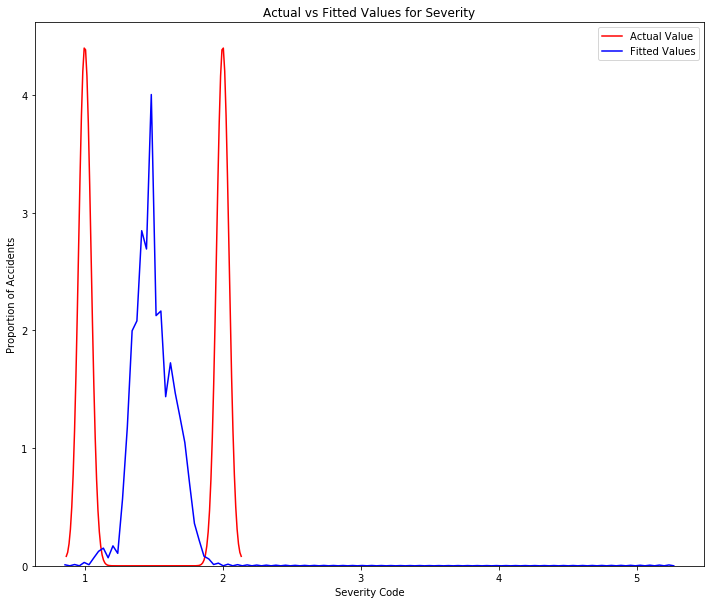

In [33]:
lr = LinearRegression()

Z = dfoversampled[['ADDRTYPE','COLLISIONTYPE','PERSONCOUNT','VEHCOUNT','JUNCTIONTYPE','INATTENTIONIND','UNDERINFL','SPEEDING','HITPARKEDCAR','WEATHER','ROADCOND','LIGHTCOND']]

lr.fit(Z,dfoversampled['SEVERITYCODE'])

Y_hat = lr.predict(Z)

plt.figure(figsize=(12,10))


ax1 = sns.distplot(dfoversampled['SEVERITYCODE'], hist=False, color="r", label="Actual Value")
sns.distplot(Y_hat, hist=False, color="b", label="Fitted Values" , ax=ax1)


plt.title('Actual vs Fitted Values for Severity')
plt.xlabel('Severity Code')
plt.ylabel('Proportion of Accidents')

plt.show()
plt.close()

In [34]:
lr.score(Z,dfoversampled['SEVERITYCODE'])

0.08413065928829888

#### Therefore the problem with the linear regression model was not the imbalanced data. This verifies our assumption that multiple linear regression will not work for this model due to categorical data being present instead of continuous

### Undersampling using NearMiss

In [35]:
y = dfnumbers['SEVERITYCODE'].values
X= dfnumbers.loc[:]
X.drop(['SEVERITYCODE'], axis=1, inplace=True)
X.drop(['ADDRTYPE'], axis=1, inplace=True)
X.drop(['JUNCTIONTYPE'], axis=1, inplace=True)
X.head()

,COLLISIONTYPE,PERSONCOUNT,VEHCOUNT,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING,HITPARKEDCAR
0,1,2,2,0,0,1,3,2,0,0
1,5,2,2,0,0,2,3,4,0,0
2,2,4,3,0,0,1,1,2,0,0
3,4,3,3,0,0,3,1,2,0,0
4,1,2,2,0,0,2,3,2,0,0


In [36]:
from collections import Counter
from imblearn.under_sampling import NearMiss

/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [38]:
undersample = NearMiss(version=1, n_neighbors=3)
usX, usy = undersample.fit_sample(X, y)
counter = Counter(usy)
print(counter)

Counter({1: 56629, 2: 56629})


## A Review of our Data

We now have 4 sources of data. <br><br>
The first 2 are used for analysis and visualization.
<ul>
    <li>Our original dataframe: df 
    <li>Dataframe with only numbers: dfnumbers <br><br>
</ul>
The next two, along with dfnumbers are used for machine learning.
<ul>
   <li> Dataframe balanced with oversampling: dfoversampled
   <li> NumPy Arrays usX and usY containing undersampled data from dfnumbers
</ul>  

In [39]:
#df holds the original data in text format
df.head()

,SEVERITYCODE,X,Y,ADDRTYPE,COLLISIONTYPE,PERSONCOUNT,VEHCOUNT,INCDATE,JUNCTIONTYPE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING,HITPARKEDCAR
0,2,-122.323148,47.703140,Intersection,Angles,2,2,2013/03/27 00:00:00+00,At Intersection (intersection related),0,0,1,Wet,Daylight,0,0
1,1,-122.347294,47.647172,Block,Sideswipe,2,2,2006/12/20 00:00:00+00,Mid-Block (not related to intersection),0,0,2,Wet,Dark - Street Lights On,0,0
2,1,-122.334540,47.607871,Block,Parked Car,4,3,2004/11/18 00:00:00+00,Mid-Block (not related to intersection),0,0,1,Dry,Daylight,0,0
3,1,-122.334803,47.604803,Block,Other,3,3,2013/03/29 00:00:00+00,Mid-Block (not related to intersection),0,0,3,Dry,Daylight,0,0
4,2,-122.306426,47.545739,Intersection,Angles,2,2,2004/01/28 00:00:00+00,At Intersection (intersection related),0,0,2,Wet,Daylight,0,0


In [40]:
#dfnumbers holds the data in numbers format
dfnumbers.head()

,SEVERITYCODE,ADDRTYPE,COLLISIONTYPE,PERSONCOUNT,VEHCOUNT,JUNCTIONTYPE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING,HITPARKEDCAR
0,2,2,1,2,2,2,0,0,1,3,2,0,0
1,1,1,5,2,2,1,0,0,2,3,4,0,0
2,1,1,2,4,3,1,0,0,1,1,2,0,0
3,1,1,4,3,3,1,0,0,3,1,2,0,0
4,2,2,1,2,2,2,0,0,2,3,2,0,0


In [41]:
#dfoversampled holds oversampled data to prevent bias in an ML model
dfoversampled.head()

,ADDRTYPE,COLLISIONTYPE,PERSONCOUNT,VEHCOUNT,JUNCTIONTYPE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING,HITPARKEDCAR,SEVERITYCODE
0,2.0,1.0,2.0,2.0,2.0,0.0,0.0,1.0,3.0,2.0,0.0,0.0,2
1,1.0,5.0,2.0,2.0,1.0,0.0,0.0,2.0,3.0,4.0,0.0,0.0,1
2,1.0,2.0,4.0,3.0,1.0,0.0,0.0,1.0,1.0,2.0,0.0,0.0,1
3,1.0,4.0,3.0,3.0,1.0,0.0,0.0,3.0,1.0,2.0,0.0,0.0,1
4,2.0,1.0,2.0,2.0,2.0,0.0,0.0,2.0,3.0,2.0,0.0,0.0,2


In [42]:
#numpy arrays hold undersampled data to prevent bias in an ML model
print(usX)
print(usy)

[[ 5  2  2 ...  4  0  0]
 [ 2  4  3 ...  2  0  0]
 [ 4  3  3 ...  2  0  0]
 ...
 [10  3  2 ...  2  0  0]
 [ 6  3  2 ...  2  0  0]
 [ 8  2  1 ...  3  0  0]]
[1 1 1 ... 2 2 2]


#### Correcting df for visualization

In [43]:
df[['INCDATE']] = df[['INCDATE']].astype('datetime64')
df['WEATHER'].replace(to_replace=[1,2,3,4,5,6,7,8,9,10], value=['Overcast','Raining','Clear','Snowing','Other','Fog/Smog/Smoke', 'Sleet/Hail/Freezing Rain','Blowing Sand/Dirt', 'Severe Crosswind','Partly Cloudy'],inplace=True)

## Data Visualization

### Distribution of Values in each Field

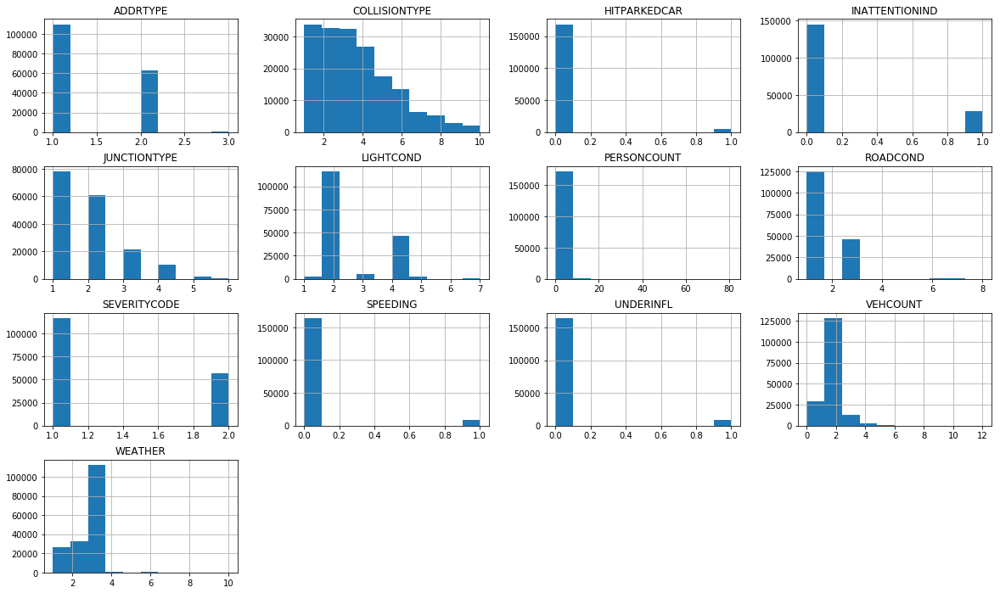

In [44]:
#Using dfnumbers so distribution is present for each category
dfnumbers.hist(figsize = (20,12))
plt.show()

### Collison Distribution over Year, Month and Day

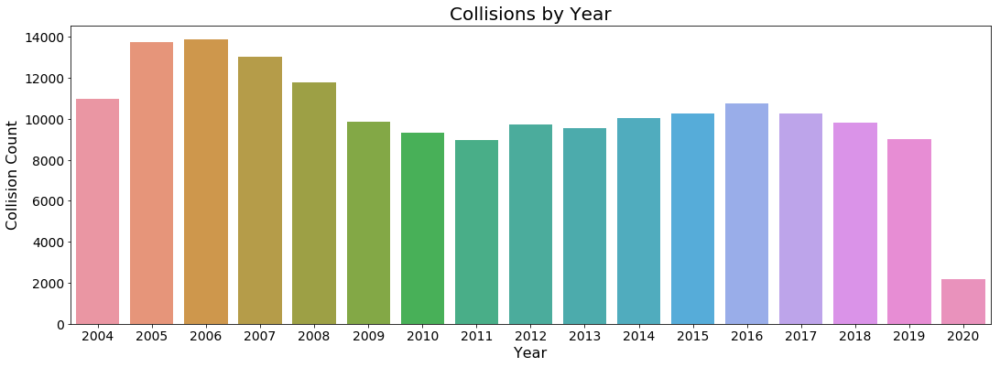

In [45]:
fig, ax = plt.subplots(figsize=(18,6))
sns.countplot(df['INCDATE'].dt.year, ax=ax)
ax.set_xlabel('Year', fontsize=16)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_ylabel('Collision Count', fontsize=16)
plt.title('Collisions by Year', fontsize=20)
plt.show()

Text(0.5, 1.0, 'Collisions by Month')

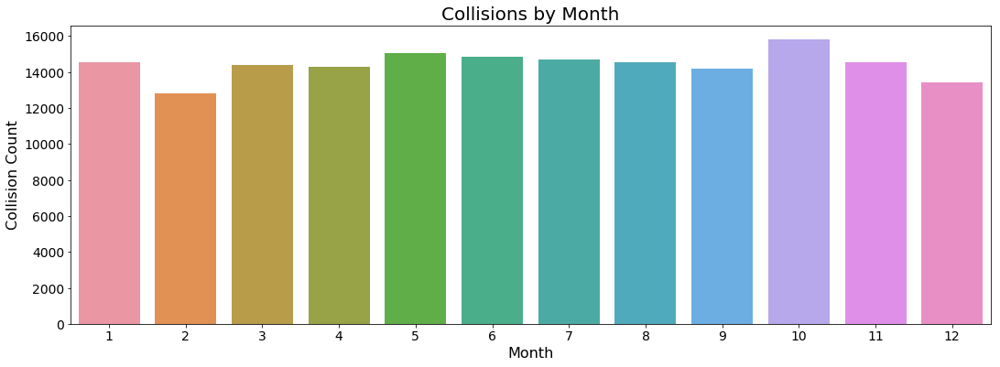

In [46]:
fig, ax = plt.subplots(figsize=(18,6))
sns.countplot(df['INCDATE'].dt.month, ax=ax)
ax.set_xlabel('Month', fontsize=16)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_ylabel('Collision Count', fontsize=16)
plt.title('Collisions by Month', fontsize=20)

Text(0.5, 1.0, 'Collisions by Day of Month')

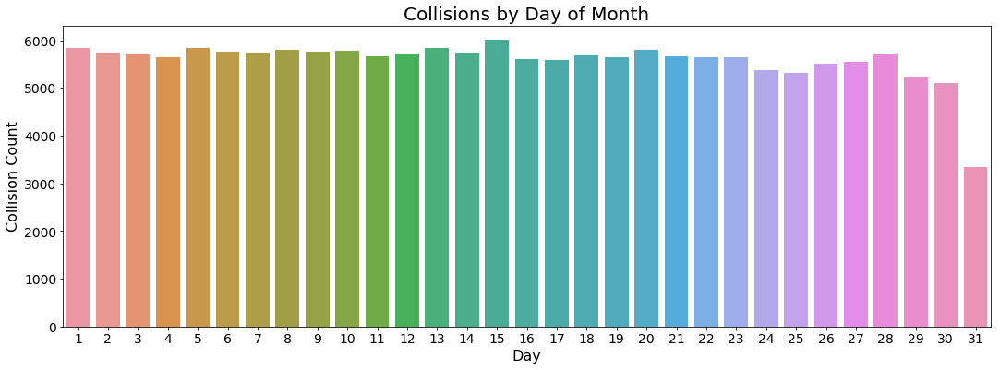

In [47]:
fig, ax = plt.subplots(figsize=(18,6))
sns.countplot(df['INCDATE'].dt.day, ax=ax)
ax.set_xlabel('Day', fontsize=16)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_ylabel('Collision Count', fontsize=16)
plt.title('Collisions by Day of Month', fontsize=20)

### Proportion of Accidents of different Severity based on Road, Light and Weather Conditions

#### Road Conditions

In [48]:
propdf = df[['SEVERITYCODE','ROADCOND']]
propdf['SEVERITYCODE'].value_counts()

code1 = propdf[propdf['SEVERITYCODE'] == 1].shape[0]
code2 = propdf[propdf['SEVERITYCODE'] == 2].shape[0]

dfcode1 = propdf[propdf['SEVERITYCODE'] == 1]
dfcode2 = propdf[propdf['SEVERITYCODE'] == 2]

propdfcode1 = dfcode1.groupby(["ROADCOND"]).count()
propdfcode2 = dfcode2.groupby(["ROADCOND"]).count()

propdfcode1['SEVERITYCODE'] = ((propdfcode1['SEVERITYCODE']/code1)*100) 
propdfcode2['SEVERITYCODE'] = ((propdfcode2['SEVERITYCODE']/code2)*100) 

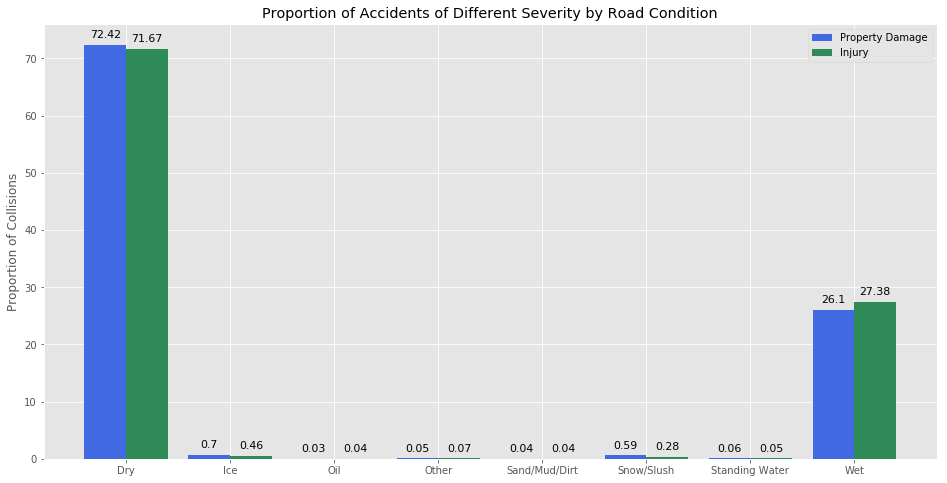

In [49]:
%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot') 

ind = np.arange(8)
width = 0.4

fig = plt.figure(figsize =(16,8))
ax = fig.add_subplot(111)
rects1 = ax.bar(ind, propdfcode1['SEVERITYCODE'], width, color='royalblue')
rects2 = ax.bar(ind+width, propdfcode2['SEVERITYCODE'], width, color='seagreen')

ax.set_ylabel('Proportion of Collisions')
ax.set_title('Proportion of Accidents of Different Severity by Road Condition')
ax.set_xticks(ind + width / 2)
ax.axes.set_xticklabels(propdfcode2.index)

ax.legend( (rects1[0], rects2[0]), ('Property Damage', 'Injury') )
    
for p in ax.patches:
    ax.annotate(np.round(p.get_height(),decimals=2), 
                (p.get_x()+p.get_width()/2., p.get_height()), 
                ha='center', 
                va='center', 
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize = 11
               )

plt.show()

#### Light Conditions

In [50]:
propdf = df[['SEVERITYCODE','LIGHTCOND']]
propdf['SEVERITYCODE'].value_counts()
code1 = propdf[propdf['SEVERITYCODE'] == 1].shape[0]
code2 = propdf[propdf['SEVERITYCODE'] == 2].shape[0]
dfcode1 = propdf[propdf['SEVERITYCODE'] == 1]
dfcode2 = propdf[propdf['SEVERITYCODE'] == 2]
propdfcode1 = dfcode1.groupby(["LIGHTCOND"]).count()
propdfcode2 = dfcode2.groupby(["LIGHTCOND"]).count()
propdfcode1['SEVERITYCODE'] = ((propdfcode1['SEVERITYCODE']/code1)*100) 
propdfcode2['SEVERITYCODE'] = ((propdfcode2['SEVERITYCODE']/code2)*100) 

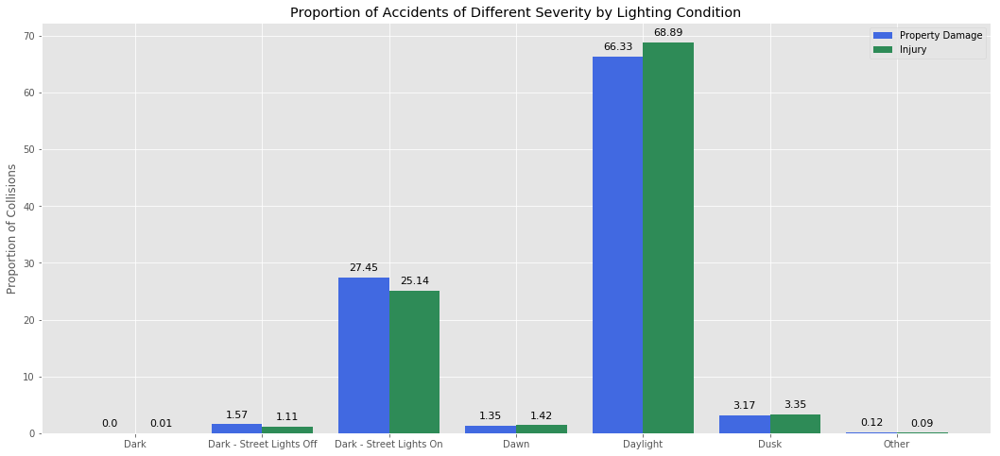

In [51]:
%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot')

ind = np.arange(7)
width = 0.4 

fig = plt.figure(figsize =(18,8))
ax = fig.add_subplot(111)
rects1 = ax.bar(ind, propdfcode1['SEVERITYCODE'], width, color='royalblue')
rects2 = ax.bar(ind+width, propdfcode2['SEVERITYCODE'], width, color='seagreen')

ax.set_ylabel('Proportion of Collisions')
ax.set_title('Proportion of Accidents of Different Severity by Lighting Condition')
ax.set_xticks(ind + width / 2)
ax.axes.set_xticklabels(propdfcode2.index)

ax.legend( (rects1[0], rects2[0]), ('Property Damage', 'Injury') )

for p in ax.patches:
    ax.annotate(np.round(p.get_height(),decimals=2), 
                (p.get_x()+p.get_width()/2., p.get_height()), 
                ha='center', 
                va='center', 
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize = 11
               )

plt.show()


#### Weather Conditions

In [52]:
propdf = df[['SEVERITYCODE','WEATHER']]
propdf['SEVERITYCODE'].value_counts()
code1 = propdf[propdf['SEVERITYCODE'] == 1].shape[0]
code2 = propdf[propdf['SEVERITYCODE'] == 2].shape[0]
dfcode1 = propdf[propdf['SEVERITYCODE'] == 1]
dfcode2 = propdf[propdf['SEVERITYCODE'] == 2]
propdfcode1 = dfcode1.groupby(["WEATHER"]).count()
propdfcode2 = dfcode2.groupby(["WEATHER"]).count()
propdfcode1['SEVERITYCODE'] = ((propdfcode1['SEVERITYCODE']/code1)*100) 
propdfcode2['SEVERITYCODE'] = ((propdfcode2['SEVERITYCODE']/code2)*100) 

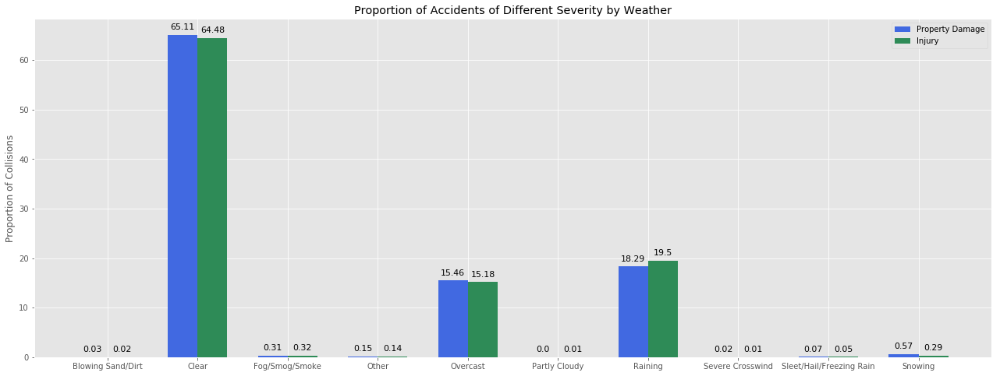

In [53]:
%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot') 

ind = np.arange(10)
width = 0.33

fig = plt.figure(figsize =(22,8))
ax = fig.add_subplot(111)
rects1 = ax.bar(ind, propdfcode1['SEVERITYCODE'], width, color='royalblue')
rects2 = ax.bar(ind+width, propdfcode2['SEVERITYCODE'], width, color='seagreen')

ax.set_ylabel('Proportion of Collisions')
ax.set_title('Proportion of Accidents of Different Severity by Weather')
ax.set_xticks(ind + width / 2)
ax.axes.set_xticklabels(propdfcode2.index)

ax.legend( (rects1[0], rects2[0]), ('Property Damage', 'Injury') )

for p in ax.patches:
    ax.annotate(np.round(p.get_height(),decimals=2), 
                (p.get_x()+p.get_width()/2., p.get_height()), 
                ha='center', 
                va='center', 
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize = 11
               )

plt.show()

### Collision Count by Address Type and Junction Type

#### Address Type

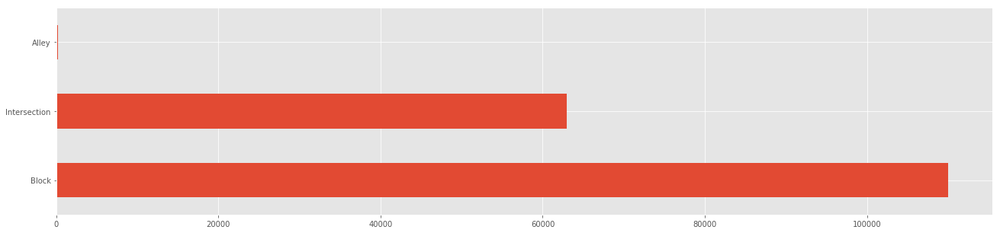

In [54]:
df['ADDRTYPE'].value_counts().plot(kind='barh', figsize = (22,5));

#### Junction Type

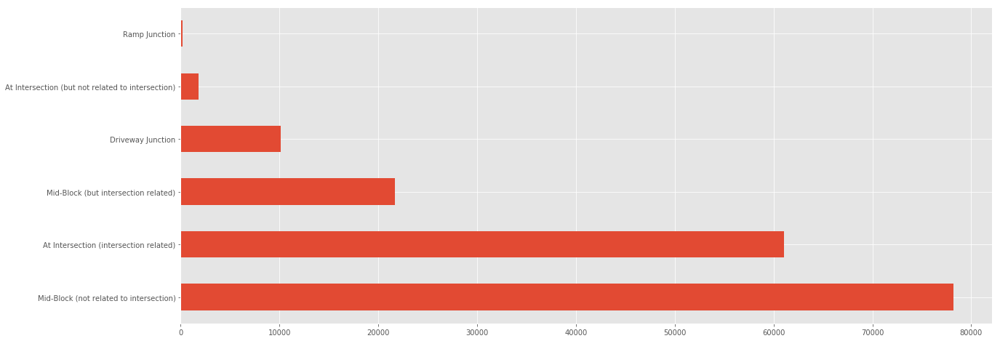

In [55]:
df['JUNCTIONTYPE'].value_counts().plot(kind='barh', figsize = (20,8));

### Proportion of Severity of Collision when Under the Influence or Caused due to Inattentiveness

#### Under the Influence

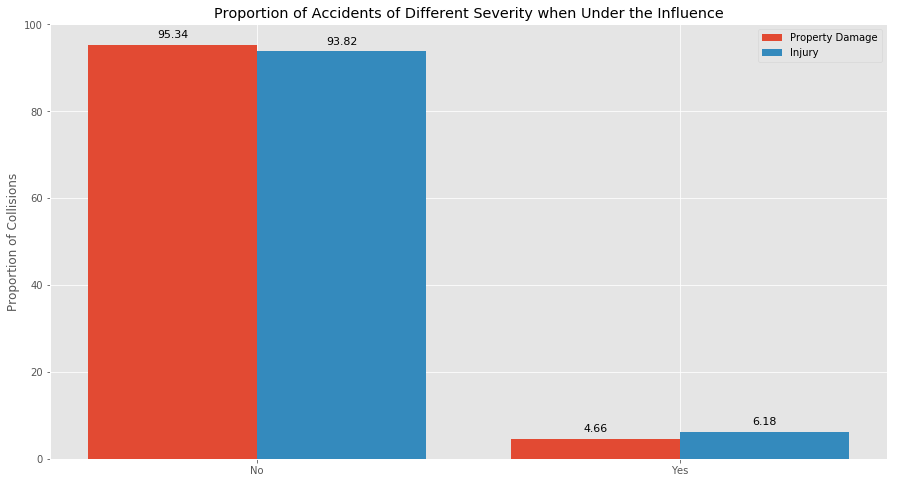

In [56]:
propdf = df[['SEVERITYCODE','UNDERINFL']]
dfcode1 = propdf[propdf['SEVERITYCODE'] == 1]
dfcode2 = propdf[propdf['SEVERITYCODE'] == 2]
propdfcode1 = dfcode1.groupby(["UNDERINFL"]).count()
propdfcode2 = dfcode2.groupby(["UNDERINFL"]).count()
propdfcode1['SEVERITYCODE'] = ((propdfcode1['SEVERITYCODE']/code1)*100) 
propdfcode2['SEVERITYCODE'] = ((propdfcode2['SEVERITYCODE']/code2)*100) 

ind = np.arange(2)
width = 0.4

fig = plt.figure(figsize =(15,8))
ax = fig.add_subplot(111)
rects1 = ax.bar(ind, propdfcode1['SEVERITYCODE'], width)
rects2 = ax.bar(ind+width, propdfcode2['SEVERITYCODE'], width)

ax.set_ylabel('Proportion of Collisions')
ax.set_title('Proportion of Accidents of Different Severity when Under the Influence')
ax.set_xticks(ind + width / 2)
ax.axes.set_xticklabels(['No','Yes'])

ax.legend( (rects1[0], rects2[0]), ('Property Damage', 'Injury') )

for p in ax.patches:
    ax.annotate(np.round(p.get_height(),decimals=2), 
                (p.get_x()+p.get_width()/2., p.get_height()), 
                ha='center', 
                va='center', 
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize = 11
               )

plt.show()

#### Inattentive

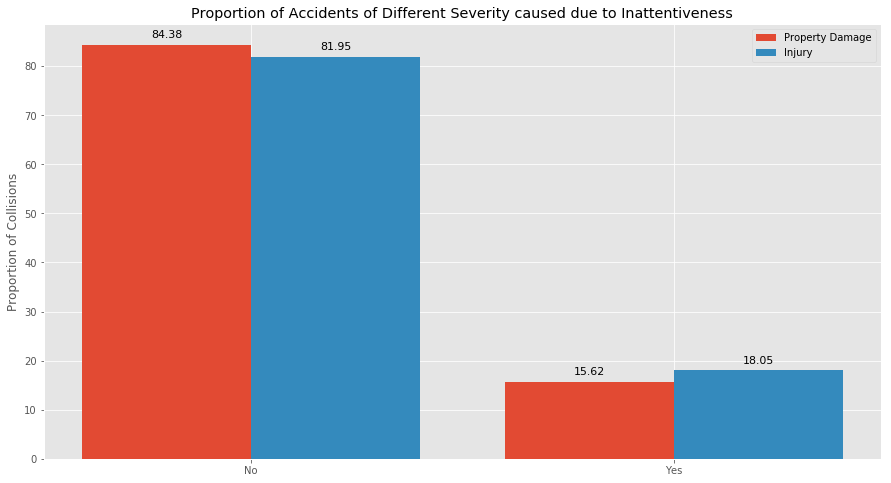

In [57]:
propdf = df[['SEVERITYCODE','INATTENTIONIND']]
dfcode1 = propdf[propdf['SEVERITYCODE'] == 1]
dfcode2 = propdf[propdf['SEVERITYCODE'] == 2]
propdfcode1 = dfcode1.groupby(["INATTENTIONIND"]).count()
propdfcode2 = dfcode2.groupby(["INATTENTIONIND"]).count()
propdfcode1['SEVERITYCODE'] = ((propdfcode1['SEVERITYCODE']/code1)*100) 
propdfcode2['SEVERITYCODE'] = ((propdfcode2['SEVERITYCODE']/code2)*100) 

ind = np.arange(2)
width = 0.4

fig = plt.figure(figsize =(15,8))
ax = fig.add_subplot(111)
rects1 = ax.bar(ind, propdfcode1['SEVERITYCODE'], width)
rects2 = ax.bar(ind+width, propdfcode2['SEVERITYCODE'], width)

ax.set_ylabel('Proportion of Collisions')
ax.set_title('Proportion of Accidents of Different Severity caused due to Inattentiveness')
ax.set_xticks(ind + width / 2)
ax.axes.set_xticklabels(['No','Yes'])

ax.legend( (rects1[0], rects2[0]), ('Property Damage', 'Injury') )

for p in ax.patches:
    ax.annotate(np.round(p.get_height(),decimals=2), 
                (p.get_x()+p.get_width()/2., p.get_height()), 
                ha='center', 
                va='center', 
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize = 11
               )

plt.show()

### Map showing distribution of location of 100 most recent collisions

#### Creating Dataset

In [58]:
recentcrimesdf = df[['SEVERITYCODE','X','Y','INCDATE']]
recentcrimesdf.sort_values(by=['INCDATE'], inplace=True, ascending=False)
limit = 100
dfplot = recentcrimesdf.iloc[0:limit, :]
dfplot.reset_index(inplace=True)
dfplot.drop('index', axis=1, inplace = True) 
dfplot[['SEVERITYCODE']]=dfplot[['SEVERITYCODE']].astype('object')
dfplot['SEVERITYCODE'].replace(to_replace=[1, 2], value=['Property Damage', 'Injury'],inplace=True)

dfplot.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  sel

,SEVERITYCODE,X,Y,INCDATE
0,Injury,-122.299160,47.579673,2020-05-20
1,Injury,-122.335574,47.610678,2020-05-19
2,Property Damage,-122.317363,47.674979,2020-05-18
3,Injury,-122.352600,47.686941,2020-05-18
4,Injury,-122.296207,47.577331,2020-05-17


In [59]:
dfplot.shape

(100, 4)

#### Installing Libraries

In [60]:
!pip install folium==0.5.0
import folium

print('Folium installed and imported!')

     |████████████████████████████████| 81kB 7.5MB/s eta 0:00:011
  Stored in directory: /home/dsxuser/.cache/pip/wheels/f8/98/ff/954791afc47740d554f0d9e5885fa09dd60c2265d42578e665
Successfully built folium
Folium installed and imported!


#### Creating Map

In [61]:
latitude = 47.6062
longitude = -122.3321
seattlemap = folium.Map(location=[latitude, longitude], zoom_start=12)

#### Displaying the Map without Clusters

In [62]:
df.plot

incidents = folium.map.FeatureGroup()

for lat, lng, in zip(dfplot.Y, dfplot.X):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5,
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

latitudes = list(dfplot.Y)
longitudes = list(dfplot.X)
labels = list(dfplot.SEVERITYCODE)

for lat, lng, label in zip(latitudes, longitudes, labels):
    folium.Marker([lat, lng], popup = folium.Popup(label)
).add_to(seattlemap)    
    
seattlemap.add_child(incidents)

#### Displaying the Map with Clusters

In [63]:
from folium import plugins

seattlemap = folium.Map(location = [latitude, longitude], zoom_start = 12)

incidents = plugins.MarkerCluster().add_to(seattlemap)

for lat, lng, label, in zip(dfplot.Y, dfplot.X, dfplot.SEVERITYCODE):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup = folium.Popup(label)
    ).add_to(incidents)

seattlemap

## Machine Learning

### Removing Fields only used for Visualization

In [64]:
dfnumbers.drop(['ADDRTYPE'], axis=1, inplace=True)
dfnumbers.drop(['JUNCTIONTYPE'], axis=1, inplace=True)
dfoversampled.drop(['JUNCTIONTYPE'], axis=1, inplace=True)
dfoversampled.drop(['ADDRTYPE'], axis=1, inplace=True)

### Creating Arrays and Preprocessing Existing Dataset (biased model)

In [65]:
y = dfnumbers['SEVERITYCODE'].values
X = dfnumbers.loc[:]
X.drop(['SEVERITYCODE'], axis=1, inplace=True)
X.head()

,COLLISIONTYPE,PERSONCOUNT,VEHCOUNT,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING,HITPARKEDCAR
0,1,2,2,0,0,1,3,2,0,0
1,5,2,2,0,0,2,3,4,0,0
2,2,4,3,0,0,1,1,2,0,0
3,4,3,3,0,0,3,1,2,0,0
4,1,2,2,0,0,2,3,2,0,0


In [66]:
from sklearn import preprocessing
X = preprocessing.StandardScaler().fit(X).transform(X)
X[0:5]

array([[-1.17498289, -0.35222956,  0.12549039, -0.44308816, -0.23318115,
        -1.90889854,  1.34186323, -0.63005625, -0.23493874, -0.16895902],
       [ 0.71834135, -0.35222956,  0.12549039, -0.44308816, -0.23318115,
        -0.65942127,  1.34186323,  1.46837737, -0.23493874, -0.16895902],
       [-0.70165183,  1.07261753,  1.64943307, -0.44308816, -0.23318115,
        -1.90889854, -0.5751143 , -0.63005625, -0.23493874, -0.16895902],
       [ 0.24501029,  0.36019399,  1.64943307, -0.44308816, -0.23318115,
         0.590056  , -0.5751143 , -0.63005625, -0.23493874, -0.16895902],
       [-1.17498289, -0.35222956,  0.12549039, -0.44308816, -0.23318115,
        -0.65942127,  1.34186323, -0.63005625, -0.23493874, -0.16895902]])

In [67]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (138469, 10) (138469,)
Test set: (34618, 10) (34618,)


### Creating Arrays and Preprocessing Oversampled Dataset

In [68]:
osy = dfoversampled['SEVERITYCODE'].values
osX = dfoversampled.loc[:]
osX.drop(['SEVERITYCODE'], axis=1, inplace=True)
osX.head()

,COLLISIONTYPE,PERSONCOUNT,VEHCOUNT,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING,HITPARKEDCAR
0,1.0,2.0,2.0,0.0,0.0,1.0,3.0,2.0,0.0,0.0
1,5.0,2.0,2.0,0.0,0.0,2.0,3.0,4.0,0.0,0.0
2,2.0,4.0,3.0,0.0,0.0,1.0,1.0,2.0,0.0,0.0
3,4.0,3.0,3.0,0.0,0.0,3.0,1.0,2.0,0.0,0.0
4,1.0,2.0,2.0,0.0,0.0,2.0,3.0,2.0,0.0,0.0


In [69]:
from sklearn import preprocessing
osX = preprocessing.StandardScaler().fit(osX).transform(osX)
osX[0:5]

array([[-1.17565833, -0.38582544,  0.14040023, -0.44933805, -0.23794631,
        -1.91608235,  1.35671446, -0.62449493, -0.23792676, -0.15107208],
       [ 0.62973673, -0.38582544,  0.14040023, -0.44933805, -0.23794631,
        -0.65974748,  1.35671446,  1.49085639, -0.23792676, -0.15107208],
       [-0.72430956,  1.01221898,  1.61370995, -0.44933805, -0.23794631,
        -1.91608235, -0.57989525, -0.62449493, -0.23792676, -0.15107208],
       [ 0.17838797,  0.31319677,  1.61370995, -0.44933805, -0.23794631,
         0.5965874 , -0.57989525, -0.62449493, -0.23792676, -0.15107208],
       [-1.17565833, -0.38582544,  0.14040023, -0.44933805, -0.23794631,
        -0.65974748,  1.35671446, -0.62449493, -0.23792676, -0.15107208]])

In [70]:
from sklearn.model_selection import train_test_split
osX_train, osX_test, osy_train, osy_test = train_test_split(osX, osy, test_size=0.2, random_state=4)
print ('Oversampled Train set:', osX_train.shape,  osy_train.shape)
print ('Oversampled Test set:', osX_test.shape,  osy_test.shape)

Oversampled Train set: (186332, 10) (186332,)
Oversampled Test set: (46584, 10) (46584,)


### Preprocessing Undersampled Arrays

In [71]:
print(usX)
print(usy)

[[ 5  2  2 ...  4  0  0]
 [ 2  4  3 ...  2  0  0]
 [ 4  3  3 ...  2  0  0]
 ...
 [10  3  2 ...  2  0  0]
 [ 6  3  2 ...  2  0  0]
 [ 8  2  1 ...  3  0  0]]
[1 1 1 ... 2 2 2]


In [72]:
from sklearn import preprocessing
usX = preprocessing.StandardScaler().fit(usX).transform(usX)
usX[0:5]

/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


array([[ 0.65184645, -0.42311912,  0.12605818, -0.41078077, -0.22920457,
        -0.66916241,  1.50522169,  1.52693097, -0.23386121, -0.06557953],
       [-0.71278147,  1.12869673,  1.76221424, -0.41078077, -0.22920457,
        -1.96410817, -0.58191537, -0.62449686, -0.23386121, -0.06557953],
       [ 0.19697048,  0.35278881,  1.76221424, -0.41078077, -0.22920457,
         0.62578336, -0.58191537, -0.62449686, -0.23386121, -0.06557953],
       [-1.16765745, -0.42311912,  0.12605818, -0.41078077, -0.22920457,
         0.62578336, -0.58191537, -0.62449686, -0.23386121, -0.06557953],
       [-1.16765745, -0.42311912,  0.12605818, -0.41078077, -0.22920457,
        -0.66916241,  1.50522169, -0.62449686, -0.23386121, -0.06557953]])

In [73]:
from sklearn.model_selection import train_test_split
usX_train, usX_test, usy_train, usy_test = train_test_split(usX, usy, test_size=0.2, random_state=4)
print ('Undersampled Train set:', usX_train.shape,  usy_train.shape)
print ('Undersampled Test set:', usX_test.shape,  usy_test.shape)

Undersampled Train set: (90606, 10) (90606,)
Undersampled Test set: (22652, 10) (22652,)


### Import Libraries for Models

In [74]:
!pip install --upgrade sklearn
!pip install graphviz
!pip install dtreeviz

Requirement already up-to-date: sklearn in /opt/conda/envs/Python36/lib/python3.6/site-packages (0.0)


In [76]:
#for KNN
from sklearn.neighbors import KNeighborsClassifier

#for Metrics
from sklearn import metrics

#for Decision Tree
from sklearn.tree import DecisionTreeClassifier

#For text Decision Tree Visualization
import graphviz
from sklearn import tree

#For visual Decision Tree Visualization
from dtreeviz.trees import dtreeviz 

#For Logistic Regression
from sklearn.linear_model import LogisticRegression

#For Evaluation
from sklearn.metrics import jaccard_similarity_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss

### 1. Original Data

#### K Nearest Neighbors

In [77]:
Ks=10
mean_acc=np.zeros((Ks-1))
std_acc=np.zeros((Ks-1))
ConfustionMx=[];
for n in range(1,Ks):
    
    kNN_model = KNeighborsClassifier(n_neighbors=n).fit(X_train,y_train)
    yhat = kNN_model.predict(X_test)
    mean_acc[n-1]=np.mean(yhat==y_test);
    std_acc[n-1]=np.std(yhat==y_test)/np.sqrt(yhat.shape[0])
    
mean_acc

array([0.67178924, 0.69264544, 0.68813912, 0.70529782, 0.70313132,
       0.71422381, 0.7018603 , 0.7159859 , 0.70214917])

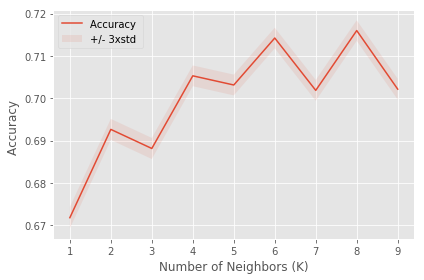

The best accuracy was with 0.7159859032873072 with k= 8


In [78]:
plt.plot(range(1,Ks),mean_acc)
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()

print( "The best accuracy was with", mean_acc.max(), "with k=", mean_acc.argmax()+1) 

In [79]:
k =  mean_acc.argmax()+1
kNN_model = KNeighborsClassifier(n_neighbors=k).fit(X_train,y_train)
kNN_model

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=8, p=2,
           weights='uniform')

#### Decision Tree

In [80]:
DT_model = DecisionTreeClassifier(criterion="entropy", max_depth = 7)
DT_model.fit(X_train,y_train)
DT_model

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=7,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

##### Visualization with Text

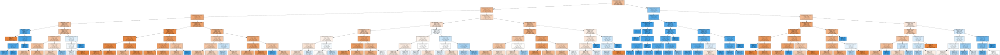

In [81]:
fn= ['COLLISIONTYPE', 'PERSONCOUNT', 'VEHCOUNT', 'INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'SPEEDING', 'HITPARKEDCAR']

cn= ['Property Damage', 'Injury']


dot_data = tree.export_graphviz(DT_model, out_file=None, 
                                feature_names=fn,  
                                class_names=cn,
                                filled=True)

graph = graphviz.Source(dot_data, format="png") 
graph

##### Visualization with Graphs

In [82]:
viz = dtreeviz(DT_model, X_train, y_train,
                target_name="SEVERITYCODE",
                feature_names=fn,
                class_names=cn)

viz

/opt/conda/envs/Python36/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
/opt/conda/envs/Python36/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
/opt/conda/envs/Python36/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


#### Logistic Regression

In [83]:
LR_model = LogisticRegression(C=0.01).fit(X_train,y_train)
LR_model

LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

#### Evaluation

In [84]:
knn_yhat = kNN_model.predict(X_test)
print("KNN Accuracy: %.2f" % metrics.accuracy_score(y_test, knn_yhat))
print("KNN Jaccard index: %.2f" % jaccard_similarity_score(y_test, knn_yhat))
print("KNN F1-score: %.2f" % f1_score(y_test, knn_yhat, average='weighted') )

KNN Accuracy: 0.72
KNN Jaccard index: 0.72
KNN F1-score: 0.69


In [85]:
DT_yhat = DT_model.predict(X_test)
print("DT Accuracy: %.2f" % metrics.accuracy_score(y_test, DT_yhat))
print("DT Jaccard index: %.2f" % jaccard_similarity_score(y_test, DT_yhat))
print("DT F1-score: %.2f" % f1_score(y_test, DT_yhat, average='weighted') )

DT Accuracy: 0.73
DT Jaccard index: 0.73
DT F1-score: 0.69


In [86]:
LR_yhat = LR_model.predict(X_test)  
LR_yhat_prob = LR_model.predict_proba(X_test)
print("LR Accuracy: %.2f" % metrics.accuracy_score(y_test, LR_yhat))
print("LR Jaccard index: %.2f" % jaccard_similarity_score(y_test, LR_yhat))
print("LR F1-score: %.2f" % f1_score(y_test, LR_yhat, average='weighted') )
print("LR LogLoss: %.2f" % log_loss(y_test, LR_yhat_prob))

LR Accuracy: 0.68
LR Jaccard index: 0.68
LR F1-score: 0.60
LR LogLoss: 0.61


### 2. Oversampled Data

#### K Nearest Neighbors

In [87]:
Ks=10
mean_acc=np.zeros((Ks-1))
std_acc=np.zeros((Ks-1))
ConfustionMx=[];
for n in range(1,Ks):
    
    kNN_model = KNeighborsClassifier(n_neighbors=n).fit(osX_train,osy_train)
    yhat = kNN_model.predict(osX_test)
    mean_acc[n-1]=np.mean(yhat==osy_test);
    std_acc[n-1]=np.std(yhat==osy_test)/np.sqrt(yhat.shape[0])
    
mean_acc

array([0.62980852, 0.62278894, 0.65307831, 0.64820539, 0.66615147,
       0.65664177, 0.6658724 , 0.6678044 , 0.66381161])

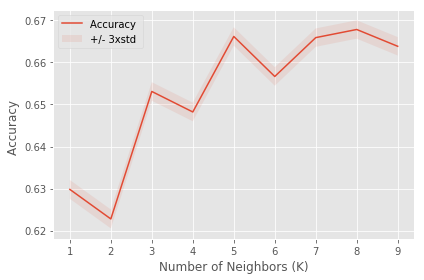

The best accuracy was with 0.667804396359265 with k= 8


In [88]:
plt.plot(range(1,Ks),mean_acc)
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()

print( "The best accuracy was with", mean_acc.max(), "with k=", mean_acc.argmax()+1) 

In [89]:
k =  mean_acc.argmax()+1
kNN_model = KNeighborsClassifier(n_neighbors=k).fit(osX_train,osy_train)
kNN_model

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=8, p=2,
           weights='uniform')

#### Decision Tree

In [90]:
DT_model = DecisionTreeClassifier(criterion="entropy", max_depth = 7)
DT_model.fit(osX_train,osy_train)
DT_model

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=7,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

##### Visualization with Text

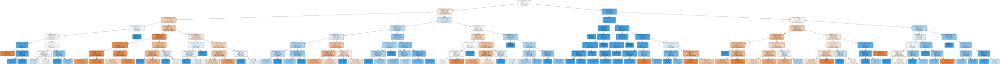

In [91]:
fn= ['COLLISIONTYPE', 'PERSONCOUNT', 'VEHCOUNT', 'INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'SPEEDING', 'HITPARKEDCAR']

cn= ['Property Damage', 'Injury']


dot_data = tree.export_graphviz(DT_model, out_file=None, 
                                feature_names=fn,  
                                class_names=cn,
                                filled=True)

graph = graphviz.Source(dot_data, format="png") 
graph

##### Visualization with Graphs

In [92]:
viz = dtreeviz(DT_model, osX_train, osy_train,
                target_name="SEVERITYCODE",
                feature_names=fn,
                class_names=cn)

viz

#### Logistic Regression

In [93]:
LR_model = LogisticRegression(C=0.01).fit(osX_train,osy_train)
LR_model

LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

#### Evaluation

In [94]:
knn_yhat = kNN_model.predict(osX_test)
print("Oversampled KNN Accuracy: %.2f" % metrics.accuracy_score(osy_test, knn_yhat))
print("Oversampled KNN Jaccard index: %.2f" % jaccard_similarity_score(osy_test, knn_yhat))
print("Oversampled KNN F1-score: %.2f" % f1_score(osy_test, knn_yhat, average='weighted') )

Oversampled KNN Accuracy: 0.67
Oversampled KNN Jaccard index: 0.67
Oversampled KNN F1-score: 0.67


In [95]:
DT_yhat = DT_model.predict(osX_test)
print("Oversampled DT Accuracy: %.2f" % metrics.accuracy_score(osy_test, DT_yhat))
print("Oversampled DT Jaccard index: %.2f" % jaccard_similarity_score(osy_test, DT_yhat))
print("Oversampled DT F1-score: %.2f" % f1_score(osy_test, DT_yhat, average='weighted') )

Oversampled DT Accuracy: 0.68
Oversampled DT Jaccard index: 0.68
Oversampled DT F1-score: 0.68


In [96]:
LR_yhat = LR_model.predict(osX_test)  
LR_yhat_prob = LR_model.predict_proba(osX_test)
print("Oversampled LR Accuracy: %.2f" % metrics.accuracy_score(osy_test, LR_yhat))
print("Oversampled LR Jaccard index: %.2f" % jaccard_similarity_score(osy_test, LR_yhat))
print("Oversampled LR F1-score: %.2f" % f1_score(osy_test, LR_yhat, average='weighted') )
print("Oversampled LR LogLoss: %.2f" % log_loss(osy_test, LR_yhat_prob))

Oversampled LR Accuracy: 0.59
Oversampled LR Jaccard index: 0.59
Oversampled LR F1-score: 0.59
Oversampled LR LogLoss: 0.66


### 3. Undersampled Data

#### K Nearest Neighbors

In [97]:
Ks=10
mean_acc=np.zeros((Ks-1))
std_acc=np.zeros((Ks-1))
ConfustionMx=[];
for n in range(1,Ks):
    
    kNN_model = KNeighborsClassifier(n_neighbors=n).fit(usX_train,usy_train)
    yhat = kNN_model.predict(usX_test)
    mean_acc[n-1]=np.mean(yhat==usy_test);
    std_acc[n-1]=np.std(yhat==usy_test)/np.sqrt(yhat.shape[0])
    
mean_acc

array([0.65755783, 0.65702808, 0.66859438, 0.67751192, 0.68669433,
       0.68506092, 0.68709165, 0.6847519 , 0.69675967])

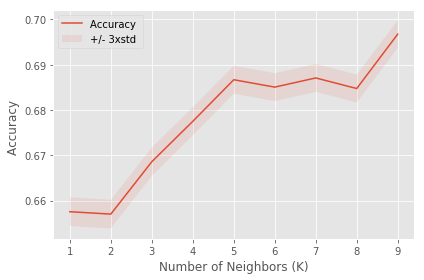

The best accuracy was with 0.6967596680204838 with k= 9


In [98]:
plt.plot(range(1,Ks),mean_acc)
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()

print( "The best accuracy was with", mean_acc.max(), "with k=", mean_acc.argmax()+1) 

In [99]:
k =  mean_acc.argmax()+1
kNN_model = KNeighborsClassifier(n_neighbors=k).fit(usX_train,usy_train)
kNN_model

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=9, p=2,
           weights='uniform')

#### Decision Tree

In [100]:
DT_model = DecisionTreeClassifier(criterion="entropy", max_depth = 7)
DT_model.fit(usX_train,usy_train)
DT_model

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=7,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

##### Visualization with Text

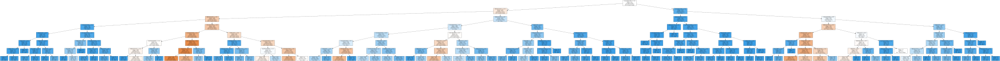

In [101]:
fn= ['COLLISIONTYPE', 'PERSONCOUNT', 'VEHCOUNT','INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'SPEEDING', 'HITPARKEDCAR']

cn= ['Property Damage', 'Injury']


dot_data = tree.export_graphviz(DT_model, out_file=None, 
                                feature_names=fn,  
                                class_names=cn,
                                filled=True)

graph = graphviz.Source(dot_data, format="png") 
graph

##### Visualization with Graphs

In [102]:
viz = dtreeviz(DT_model, usX_train, usy_train,
                target_name="SEVERITYCODE",
                feature_names=fn,
                class_names=cn)

viz

#### Logistic Regression

In [103]:
LR_model = LogisticRegression(C=0.01).fit(usX_train,usy_train)
LR_model

LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

#### Evaluation

In [105]:
knn_yhat = kNN_model.predict(usX_test)
print("Undersampled KNN Accuracy: %.2f" % metrics.accuracy_score(usy_test, knn_yhat))
print("Undersampled KNN Jaccard index: %.2f" % jaccard_similarity_score(usy_test, knn_yhat))
print("Undersampled KNN F1-score: %.2f" % f1_score(usy_test, knn_yhat, average='weighted') )

Undersampled KNN Accuracy: 0.70
Undersampled KNN Jaccard index: 0.70
Undersampled KNN F1-score: 0.70


In [106]:
DT_yhat = DT_model.predict(usX_test)
print("Undersampled DT Accuracy: %.2f" % metrics.accuracy_score(usy_test, DT_yhat))
print("Undersampled DT Jaccard index: %.2f" % jaccard_similarity_score(usy_test, DT_yhat))
print("Undersampled DT F1-score: %.2f" % f1_score(usy_test, DT_yhat, average='weighted') )

Undersampled DT Accuracy: 0.70
Undersampled DT Jaccard index: 0.70
Undersampled DT F1-score: 0.70


In [108]:
LR_yhat = LR_model.predict(usX_test)  
LR_yhat_prob = LR_model.predict_proba(usX_test)
print("Undersampled LR Accuracy: %.2f" % metrics.accuracy_score(usy_test, LR_yhat))
print("Undersampled LR Jaccard index: %.2f" % jaccard_similarity_score(usy_test, LR_yhat))
print("Undersampled LR F1-score: %.2f" % f1_score(usy_test, LR_yhat, average='weighted') )
print("Undersampled LR LogLoss: %.2f" % log_loss(usy_test, LR_yhat_prob))

Undersampled LR Accuracy: 0.64
Undersampled LR Jaccard index: 0.64
Undersampled LR F1-score: 0.63
Undersampled LR LogLoss: 0.64


##### The decision tree consistently performs as the best model no matter what data is used.

### Confusion Matrix and Classification Reports of Best Model in each Dataset

#### Unbalanced Numbers Dataset - Confusion Matrix

Confusion matrix, without normalization
[[21878  1295]
 [ 8070  3375]]


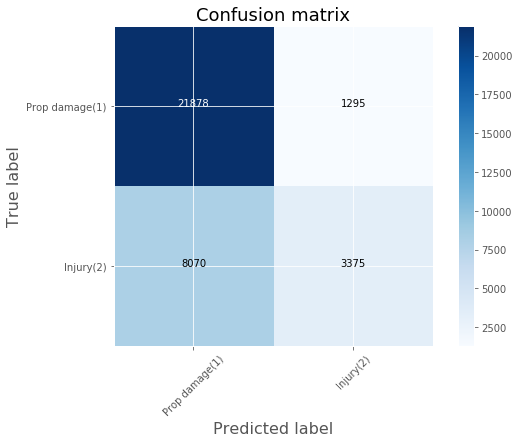

In [124]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools

DT_model = DecisionTreeClassifier(criterion="entropy", max_depth = 7)
DT_model.fit(X_train,y_train)
DT_yhat = DT_model.predict(X_test)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=18)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label', fontsize=16)
    plt.xlabel('Predicted label', fontsize=16)

cnf_matrix = confusion_matrix(y_test, DT_yhat, labels=[1,2])
np.set_printoptions(precision=2)

plt.figure(figsize=(8,6))
plot_confusion_matrix(cnf_matrix, classes=['Prop damage(1)','Injury(2)'],normalize= False,  title='Confusion matrix')

#### Unbalanced Numbers Dataset - Classification Report

In [125]:
print (classification_report(y_test, DT_yhat))

             precision    recall  f1-score   support

          1       0.73      0.94      0.82     23173
          2       0.72      0.29      0.42     11445

avg / total       0.73      0.73      0.69     34618



#### Oversampled Dataset - Confusion Matrix

Confusion matrix, without normalization
[[12885 10459]
 [ 4226 19014]]


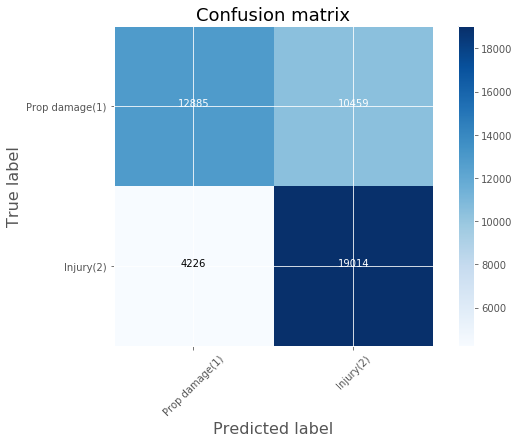

In [120]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools

DT_model = DecisionTreeClassifier(criterion="entropy", max_depth = 7)
DT_model.fit(osX_train,osy_train)
DT_yhat = DT_model.predict(osX_test)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=18)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label', fontsize=16)
    plt.xlabel('Predicted label', fontsize=16)

cnf_matrix = confusion_matrix(osy_test, DT_yhat, labels=[1,2])
np.set_printoptions(precision=2)

plt.figure(figsize=(8,6))
plot_confusion_matrix(cnf_matrix, classes=['Prop damage(1)','Injury(2)'],normalize= False,  title='Confusion matrix')

#### Oversampled Dataset - Classification Report

In [121]:
print (classification_report(osy_test, DT_yhat))

             precision    recall  f1-score   support

          1       0.75      0.55      0.64     23344
          2       0.65      0.82      0.72     23240

avg / total       0.70      0.68      0.68     46584



#### Undersampled Dataset - Confusion Matrix

Confusion matrix, without normalization
[[8342 2983]
 [3706 7621]]


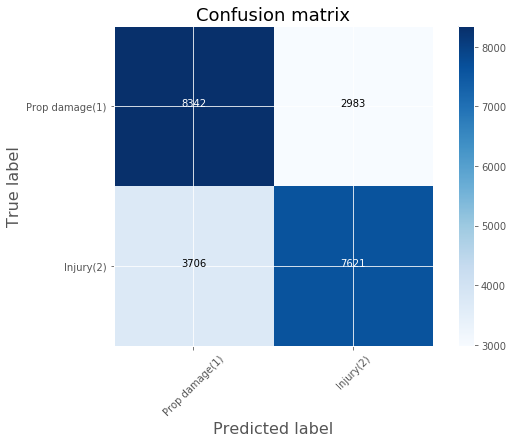

In [122]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools

DT_model = DecisionTreeClassifier(criterion="entropy", max_depth = 7)
DT_model.fit(usX_train,usy_train)
DT_yhat = DT_model.predict(usX_test)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=18)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label', fontsize=16)
    plt.xlabel('Predicted label', fontsize=16)

cnf_matrix = confusion_matrix(usy_test, DT_yhat, labels=[1,2])
np.set_printoptions(precision=2)

plt.figure(figsize=(8,6))
plot_confusion_matrix(cnf_matrix, classes=['Prop damage(1)','Injury(2)'],normalize= False,  title='Confusion matrix')

#### Undersampled Dataset - Classification Report

In [123]:
print (classification_report(usy_test, DT_yhat))

             precision    recall  f1-score   support

          1       0.69      0.74      0.71     11325
          2       0.72      0.67      0.69     11327

avg / total       0.71      0.70      0.70     22652



## Results

The resuls of model evaluation, only showing accuracy are:
<ol>
    <li> <b>Biased Model</b>
         <ul>
            <li> K-Nearest Neighbors Accuracy: 0.72
            <li> Decision Tree Accuracy: 0.73
            <li> Logistic Regression Accuracy: 0.68
          </ul>
    <br>
    <li> <b>Oversampled Model</b>
         <ul>
            <li> K-Nearest Neighbors Accuracy: 0.67
            <li> Decision Tree Accuracy: 0.68
            <li> Logistic Regression Accuracy: 0.59
          </ul>
    <br>
    <li> <b>Undersampled Model</b>
         <ul>
            <li> K-Nearest Neighbors Accuracy: 0.70
            <li> Decision Tree Accuracy: 0.70
            <li> Logistic Regression Accuracy: 0.64
          </ul>
</ol>


The following are the detailed results of model evaluation, including Best k, Jaccard Index, F1 Score and Log Loss

<ol>
    <li> <b>Biased Model</b>
         <ol>
            <li> K-Nearest Neighbors:
                <ul> 
                    <li> Value of best k = 8
                    <li> Jaccard Score = 0.72
                    <li> F1 Score = 0.69
                </ul>
             <li> Decision Tree:
                <ul> 
                    <li> Jaccard Score = 0.73
                    <li> F1 Score = 0.69
                </ul>
             <li> Logistic Regression:
                <ul> 
                    <li> Jaccard Score = 0.68
                    <li> F1 Score = 0.60
                    <li> Log Loss = 0.61
                </ul>
          </ol>
    <br>
    <li> <b>Oversampled Model</b>
         <ol>
            <li> K-Nearest Neighbors:
                <ul> 
                    <li> Value of best k = 8
                    <li> Jaccard Score = 0.67
                    <li> F1 Score = 0.67
                </ul>
             <li> Decision Tree:
                <ul> 
                    <li> Jaccard Score = 0.68
                    <li> F1 Score = 0.68
                </ul>
             <li> Logistic Regression:
                <ul> 
                    <li> Jaccard Score = 0.59
                    <li> F1 Score = 0.59
                    <li> Log Loss = 0.66
                </ul>
          </ol>
    <br>
    <li> <b>Undersampled Model</b>
         <ol>
            <li> K-Nearest Neighbors:
                <ul> 
                    <li> Value of best k = 9
                    <li> Jaccard Score = 0.70
                    <li> F1 Score = 0.70
                </ul>
             <li> Decision Tree:
                <ul> 
                    <li> Jaccard Score = 0.70 
                    <li> F1 Score = 0.70
                </ul>
             <li> Logistic Regression:
                <ul> 
                    <li> Jaccard Score = 0.64
                    <li> F1 Score = 0.63
                    <li> Log Loss = 0.64
                </ul>
          </ol>
</ol>
               
The overall best model for predicting the severity of an accident is a biased Decision Tree with a Jaccard Score of 0.73 and an F1 score of 0.69 .<br> 
The accuracy rate of this model is 0.73.

To confirm that the best model is consistent, we look at the classification reports of the Decision Tree models.

When looking at a detailed classification report, we find that going with a biased decision tree is a bad idea. This is because the classification report shows an accuracy of 0.82 when predicting a SEVERITYCODE of 1 but an accuracy of only 0.42 when predicting 2. The model is extremely biased and cannot accurately predict SEVERITYCODE 2.  
So we now compare the decision tree models of the oversampled and undersampled data. A quick look shows us that the decision tree of the undersampled data gives us the most consistent and accurate model.

Thus the __recommended model is the Decision Tree, with data being undersampled__. This has a Jaccard Score, an F1 Score and an Accuracy of __0.70__.